In [ ]:
# load npy
# turn to npy to do all of these in parallel, one section at a time, white space non tissue
# ink removal
# label expansion with bayes
# downsize original and labeled image? no! maybe by 2

# notes
# ink removal here, in future at beginning
# next script, stitch and open sea dragon; v2 go 3D model; start with patient and do ordering; rotation matrix from shapes
# stain norm at beginning of entire pipeline
# stain norm here? in future do at beginning



In [1]:
# given posterior distribution ; may also help out with histobayes
# randomly sample from predictive posterior during training
# add training 
# new graph construction given more datapoints in between
# single graph prediction propagation, bce with probability
# trim new points at beginning with tissue mask to avoid grabbing 256 over, which propagates to rest of slide, else maybe initialize with argmaxed label propagation first

# start with one graph


import copy, torch, os
from sklearn.decomposition import PCA
import copy, numpy as np
from sklearn.preprocessing import LabelBinarizer
from sklearn.semi_supervised import LabelPropagation, LabelSpreading
import numpy.ma as ma
from sklearn.metrics import classification_report, f1_score
from scipy import stats
import warnings
warnings.filterwarnings('ignore')

import pickle
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import LabelBinarizer
from itertools import product
from sklearn.neighbors import radius_neighbors_graph
from torch_geometric.utils import from_scipy_sparse_matrix
from torch_geometric.data import Data
import torch.nn as nn
from torch.nn import functional as F
from torch_geometric.nn import APPNP, AGNNConv, GATConv
import matplotlib,matplotlib.pyplot as plt
import cv2

import numpy as np
import tqdm



%matplotlib inline
matplotlib.rcParams['figure.dpi']=300


In [2]:



class Net(nn.Module):
    def __init__(self,n_layers=3,K=5,alpha=0.2,self_loops=False):
        super().__init__()
        assert n_layers>=2
        self.propagate=nn.ModuleList([APPNP(K=K,alpha=alpha,add_self_loops=self_loops) for i in range(n_layers)])#AGNNConv()
        
    def forward(self,x,edge_index,mask):
        x_mask=x[mask]
        for layer in self.propagate[:-1]:
            x=layer(x,edge_index)
            x_mask=x[mask]
            # relu?
        x_mask=x[mask]
        return self.propagate[-1](x,edge_index)
        




no_pretrain=False
j=4
cv_splits='bcc/graph_datasets/cv_splits_256_pretrain.pkl'
cv_splits=pickle.load(open(cv_splits,'rb'))

prediction_file="bcc/predictions/4.predictions.pth"
graph_dataset=pickle.load(open("bcc/graph_datasets/pretrain_graph_data_256.pkl",'rb'))
print(prediction_file)
val_idx=cv_splits[j]['train_idx']
test_idx=cv_splits[j]['val_idx']
graphs=torch.load(prediction_file)


val_graphs=graphs[:len(val_idx)]
test_graphs=graphs[len(val_idx):]

bcc/predictions/4.predictions.pth


In [3]:
# idx
#np.hstack([val_idx,test_idx])

In [4]:
# [slide.id for slide in graph_dataset['graph_dataset']]

In [5]:
# val_graphs

In [6]:


# 



# [(x,y) for x,y in ]

# val_idx

In [28]:
! ps aux | grep f003k8w

root      38555  0.0  0.0 185784  6512 ?        Ss   11:43   0:00 sshd: f003k8w [priv]
f003k8w   38565  0.0  0.0 186200  3144 ?        S    11:43   0:25 sshd: f003k8w@pts/0
f003k8w   38566  0.0  0.0 130164  4488 pts/0    Ss   11:43   0:00 -bash
root      39032  0.0  0.0 185784  6504 ?        Ss   12:00   0:00 sshd: f003k8w [priv]
f003k8w   39036  0.0  0.0 186084  3068 ?        S    12:00   0:12 sshd: f003k8w@pts/1
f003k8w   39037  0.0  0.0 130184  4444 pts/1    Ss   12:00   0:00 -bash
f003k8w   39280  0.0  0.0 361944 21928 pts/0    Sl+  12:01   0:00 Singularity runtime parent
f003k8w   39305  0.5  0.0 874180 166656 pts/0   Sl+  12:01   2:28 /home/anaconda3/bin/python /home/anaconda3/bin/jupyter-notebook --no-browser --ip 127.0.0.1 --port 8050
f003k8w   39621  2.3  0.0 1749632 178984 pts/1  S+   12:02  11:28 python -m visdom.server -port 5555
f003k8w   44405  0.0  0.0 487296 43924 ?        Ssl  15:01   0:00 /home/anaconda3/bin/python -m ipykernel_launcher -f /dartfs-hpc/rc/home/w/f003k8

In [7]:
# graph_dataset['graph_dataset']

In [8]:
# for now just consider marginalized posterior, in future, add random sampling from posterior
# loss for now will be MSE to logits???


basename="140_A1c"
print("Loading Slide")
arr=np.load(f"bcc/inputs/{basename}.npy")
pred_map=np.zeros(arr.shape[:2])
division_map=np.zeros(arr.shape[:2])

for j in range(3):
    print(f"Processing Slide [{j+1}/3]")
#     j=0
    idx=val_idx[j]

    graph=val_graphs[j]
    
    print("Getting new interpolation points")

    xmin,ymin=graph['xy'].min(0).astype(int)#graph_dataset['graph_dataset'][idx].pos.values.numpy()
    xmax,ymax=graph['xy'].max(0).astype(int)

    grid=np.array(list(product(range(xmin,xmax,32),range(ymin,ymax,32))))

    G=radius_neighbors_graph(np.vstack([graph['xy'],grid]),radius=16) # then deduplicate and add .. hmm maybe just build off of current graph
    grid=np.delete(grid,G.nonzero()[1][:int(len(G.nonzero()[0])/2)]-len(graph['xy']),axis=0)

    G=radius_neighbors_graph(np.vstack([graph['xy'],grid]),radius=256*np.sqrt(2)) # then deduplicate and add .. hmm maybe just build off of current graph

    new_pos=np.vstack([graph['xy'],grid])[np.where(np.array(G[:,:len(graph['xy'])].sum(1)>0).flatten())[0],:]

    G=radius_neighbors_graph(new_pos,radius=32*np.sqrt(2))

    edge_index=from_scipy_sparse_matrix(G)[0]

    x_old=graph['y_pred']
    knn=KNeighborsClassifier(n_neighbors=1).fit(graph['xy'],x_old.argmax(1))
    prior=knn.predict(new_pos[len(graph['xy']):])
    x_new=np.zeros((G.shape[0]-len(graph['xy']),x_old.shape[1]))
    x_new[:,1]=prior
    x_new[:,0]=1-prior
    # 
    x=torch.tensor(np.vstack([x_old,x_new])).float()
    mask=np.array([False]*len(x))
    mask[:len(graph['xy'])]=True
    
    print("Propagating Probability Map")
    
    graph_data=Data(x=x,edge_index=edge_index,mask=torch.tensor(mask),pos=torch.tensor(new_pos))

    graph_data.x=graph_data.x.cuda()
    graph_data.mask=graph_data.mask.cuda()
    graph_data.edge_index=graph_data.edge_index.cuda()

    net=Net(n_layers=30,
           K=15,
           alpha=0.1,
           self_loops=False).cuda()

    y_pred=F.softmax(net(graph_data.x,graph_data.edge_index,graph_data.mask))

    idx=val_idx[j]
    # graph_dataset['graph_dataset'][idx].id

    preds=y_pred.detach().cpu().numpy()[:,1]

    print("Applying Labels to Map")
    
    patch_size=256
    for i,(x,y) in tqdm.tqdm(list(enumerate(graph_data.pos.numpy().astype(int).tolist()))):
        pred_map[x:x+patch_size,y:y+patch_size]+=preds[i]
        division_map[x:x+patch_size,y:y+patch_size]+=1.
    
    
    
print("Blending Final Image")
division_map[division_map==0]=1
pred_map=pred_map/division_map
del division_map
# arr=cv2.resize(arr,None,fx=1/6.,fy=1/6.)
small_pred_map=pred_map#cv2.resize(pred_map,None,fx=1/6.,fy=1/6.)
new_pred_map = cv2.applyColorMap((small_pred_map*255.).astype(np.uint8), cv2.COLORMAP_JET)
# ADD GAUSSIAN BLUR HERE ^^^ in future
alpha=0.3
blended_image=(arr*(1-alpha)+(255-new_pred_map)*alpha).astype(np.uint8)
blended_image[small_pred_map==0,:]=arr[small_pred_map==0,:]

# cut up here, add ordering, which will integrate in final stitching with dynamic alignment

# plt.imshow(blended_image)

# fix right here initialize label with original neighbor

# WHY DO PROBABILITY MAPS CHANGE EVERY ITERATION!!!! HELP!!!! :O FIX FIX FIX See slack

Loading Slide
Processing Slide [1/3]
Getting new interpolation points
Propagating Probability Map
Applying Labels to Map


100%|██████████| 295165/295165 [00:56<00:00, 5198.94it/s]


Processing Slide [2/3]
Getting new interpolation points
Propagating Probability Map
Applying Labels to Map


100%|██████████| 196039/196039 [00:36<00:00, 5416.38it/s]


Processing Slide [3/3]
Getting new interpolation points
Propagating Probability Map
Applying Labels to Map


100%|██████████| 171019/171019 [00:31<00:00, 5418.05it/s]


Blending Final Image


In [27]:
# ! ls bcc/interactive_test
# import subprocess,glob

# for f in glob.glob("bcc/interactive_test/*.png"):
#     subprocess.call("mv {} {}".format(f,os.path.join(os.path.dirname(f),f"{basename}.{os.path.basename(f)}")),shell=True)

In [22]:
# ! mkdir bcc/interactive_test
# ! pip install git+https://github.com/openzoom/deepzoom.py.git

In [30]:
! ls -lah bcc/interactive_test/

total 3.0G
drwxrwx---  2 f003k8w rc-VaickusL_slow-admin  225 Sep 18 19:54 .
drwxrwx--- 18 f003k8w rc-VaickusL_slow-admin 8.8K Sep 18 20:01 ..
-rwxrwx---  1 f003k8w rc-VaickusL_slow-admin 419M Sep 18 20:27 140_A1c.img.0.png
-rwxrwx---  1 f003k8w rc-VaickusL_slow-admin 419M Sep 18 20:27 140_A1c.img.1.png
-rwxrwx---  1 f003k8w rc-VaickusL_slow-admin 419M Sep 18 20:27 140_A1c.img.2.png
-rwxrwx---  1 f003k8w rc-VaickusL_slow-admin 384M Sep 18 20:27 140_A1c.prob_map.0.png
-rwxrwx---  1 f003k8w rc-VaickusL_slow-admin 384M Sep 18 20:27 140_A1c.prob_map.1.png
-rwxrwx---  1 f003k8w rc-VaickusL_slow-admin 384M Sep 18 20:28 140_A1c.prob_map.2.png


In [ ]:
for j,k in enumerate(np.argsort([val_graphs[j]['xy'].max(0)[1] for j in range(3)]).tolist()):
    graph=val_graphs[k]
    xmin,ymin=graph['xy'].min(0).astype(int)#graph_dataset['graph_dataset'][idx].pos.values.numpy()
    xmax,ymax=graph['xy'].max(0).astype(int)
    cv2.imwrite(f"bcc/interactive_test/{basename}.img.{j}.png",cv2.cvtColor(arr[xmin:xmax,ymin:ymax],cv2.COLOR_BGR2RGB))
    cv2.imwrite(f"bcc/interactive_test/{basename}.prob_map.{j}.png",cv2.cvtColor(blended_image[xmin:xmax,ymin:ymax],cv2.COLOR_BGR2RGB))
    
# next is alignment program & remove white space & combine with other slides alphabetically
# ^ align & ink & white space & order
# then openseadragon, but try this one next

# for j in range(3):

In [12]:
val_graphs[1]['xy'].max(0)[1]


array([34048., 36096.], dtype=float32)

In [13]:
val_graphs[2]['xy'].max(0)


array([36608., 12800.], dtype=float32)

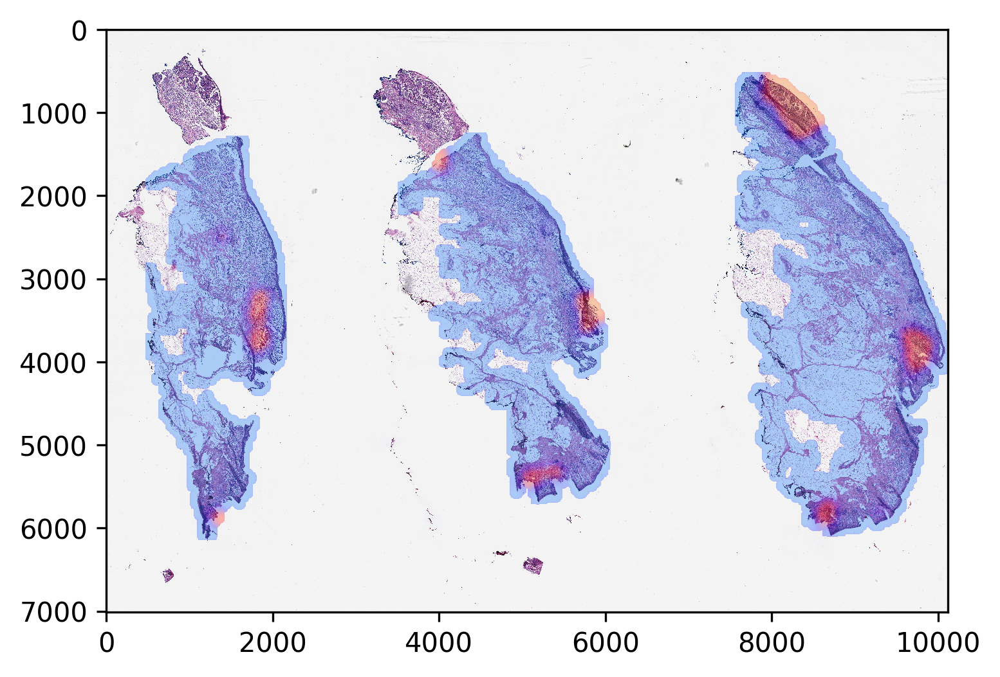

In [9]:
plt.imshow(cv2.resize(blended_image,None,fx=1/6.,fy=1/6.))

In [ ]:
# decide ordering -> pngx2 per section
# then for each section, tissue mask and point cloud alignment or airlab, borrow tissue mask to crop the probability counterpart

In [356]:
# alpha=0.3
# blended_image=(arr*(1-alpha)+(255-new_pred_map)*alpha).astype(np.uint8)



In [361]:
# blended_image[small_pred_map==0,:]=arr[small_pred_map==0,:]
# plt.imshow((arr*(1-alpha)+(255-new_pred_map)*alpha).astype(np.uint8))



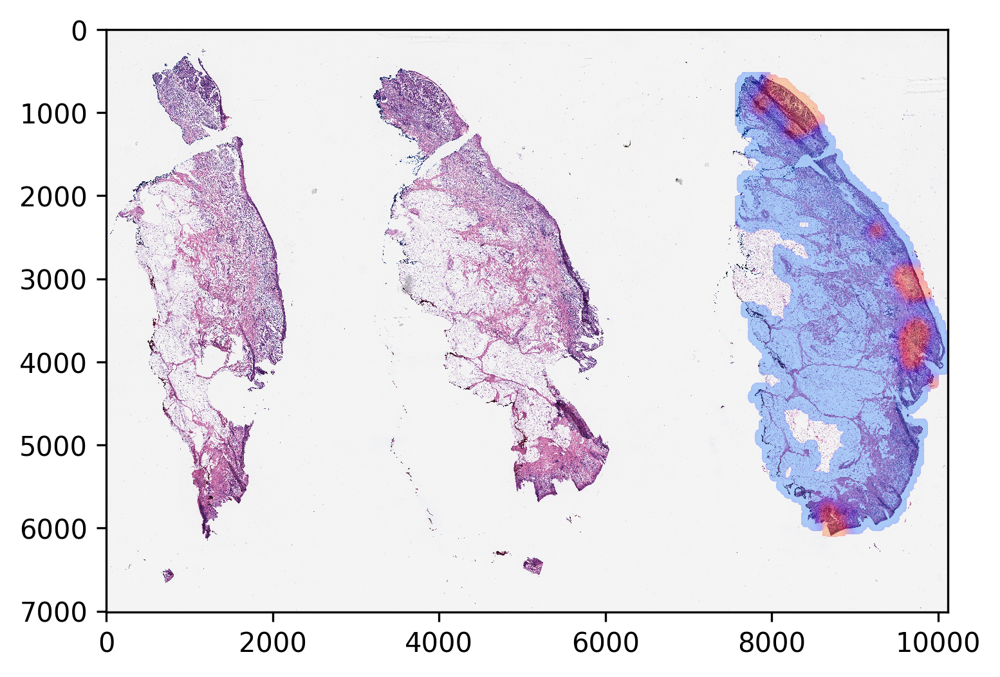

In [362]:
plt.imshow(blended_image)





In [295]:
# OLD!!!!!!!


In [296]:
# https://raw.githubusercontent.com/snorkel-team/snorkel/master/snorkel/classification/loss.py

from typing import List, Mapping, Optional

import torch
import torch.nn.functional as F

Outputs = Mapping[str, List[torch.Tensor]]


def cross_entropy_with_probs(
    input: torch.Tensor,
    target: torch.Tensor,
    weight: Optional[torch.Tensor] = None,
    reduction: str = "mean",
) -> torch.Tensor:
    """Calculate cross-entropy loss when targets are probabilities (floats), not ints.

    PyTorch's F.cross_entropy() method requires integer labels; it does accept
    probabilistic labels. We can, however, simulate such functionality with a for loop,
    calculating the loss contributed by each class and accumulating the results.
    Libraries such as keras do not require this workaround, as methods like
    "categorical_crossentropy" accept float labels natively.

    Note that the method signature is intentionally very similar to F.cross_entropy()
    so that it can be used as a drop-in replacement when target labels are changed from
    from a 1D tensor of ints to a 2D tensor of probabilities.

    Parameters
    ----------
    input
        A [num_points, num_classes] tensor of logits
    target
        A [num_points, num_classes] tensor of probabilistic target labels
    weight
        An optional [num_classes] array of weights to multiply the loss by per class
    reduction
        One of "none", "mean", "sum", indicating whether to return one loss per data
        point, the mean loss, or the sum of losses

    Returns
    -------
    torch.Tensor
        The calculated loss

    Raises
    ------
    ValueError
        If an invalid reduction keyword is submitted
    """
    num_points, num_classes = input.shape
    # Note that t.new_zeros, t.new_full put tensor on same device as t
    cum_losses = input.new_zeros(num_points)
    for y in range(num_classes):
        target_temp = input.new_full((num_points,), y, dtype=torch.long)
        y_loss = F.cross_entropy(input, target_temp, reduction="none")
        if weight is not None:
            y_loss = y_loss * weight[y]
        cum_losses += target[:, y].float() * y_loss

    if reduction == "none":
        return cum_losses
    elif reduction == "mean":
        return cum_losses.mean()
    elif reduction == "sum":
        return cum_losses.sum()
    else:
        raise ValueError("Keyword 'reduction' must be one of ['none', 'mean', 'sum']")

In [297]:

    



#y_pred=F.softmax(net(graph_data.x,graph_data.edge_index)).detach().numpy() # ???)
# plt.scatter(*graph_data.pos.numpy().T.tolist(),c=y_pred.argmax(1),s=1e-5)


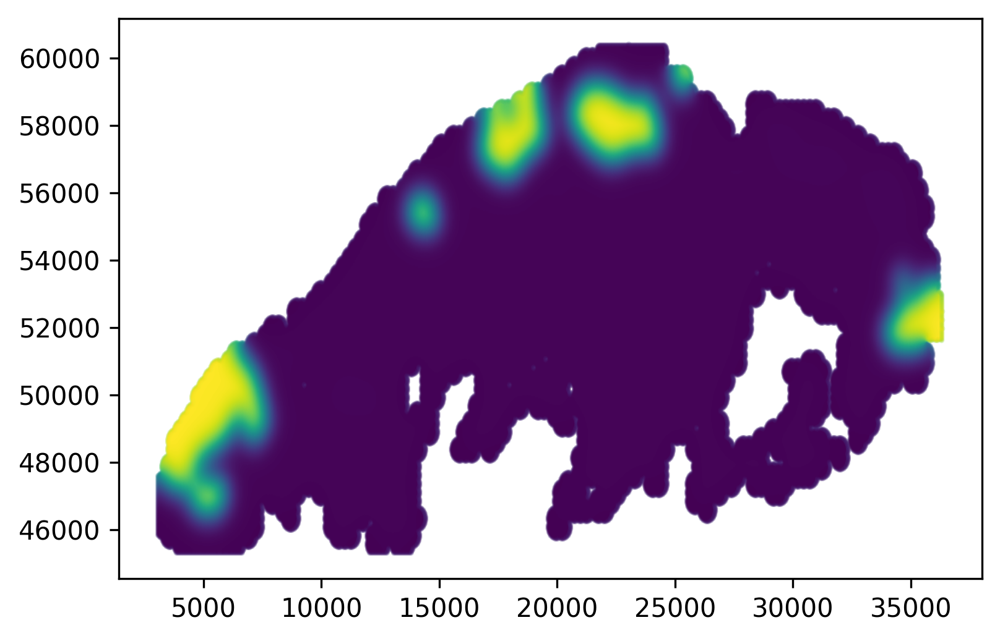

In [298]:
# good enough for now, fix the outside points


plt.scatter(*graph_data.pos.numpy().T.tolist(),c=y_pred.detach().cpu().numpy()[:,1],s=1,alpha=0.2)#.argmax(1)

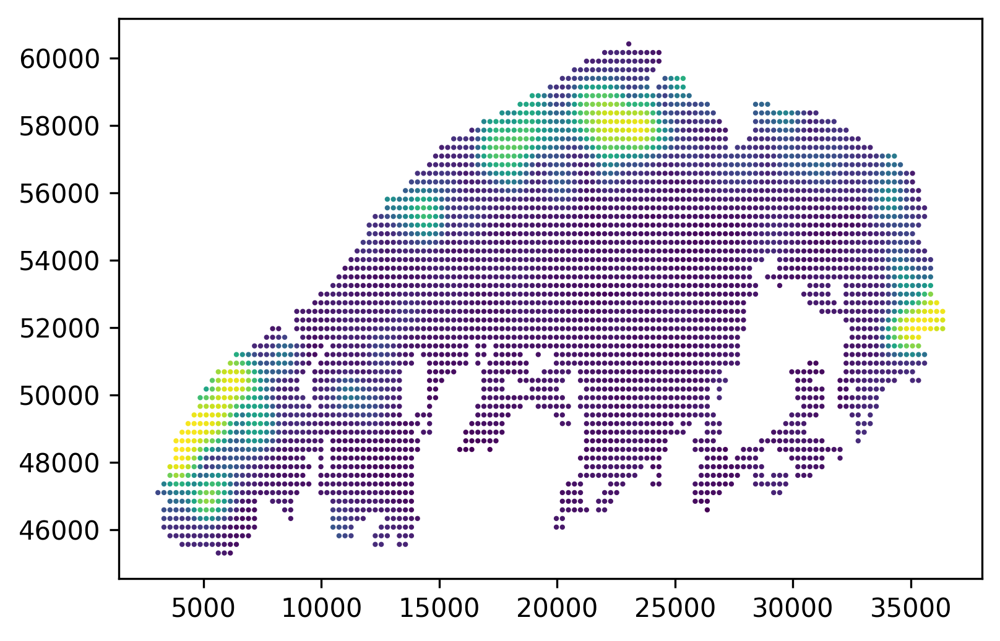

In [278]:
plt.scatter(*graph['xy'].T.tolist(),c=graph['y_pred'][:,1],s=1)

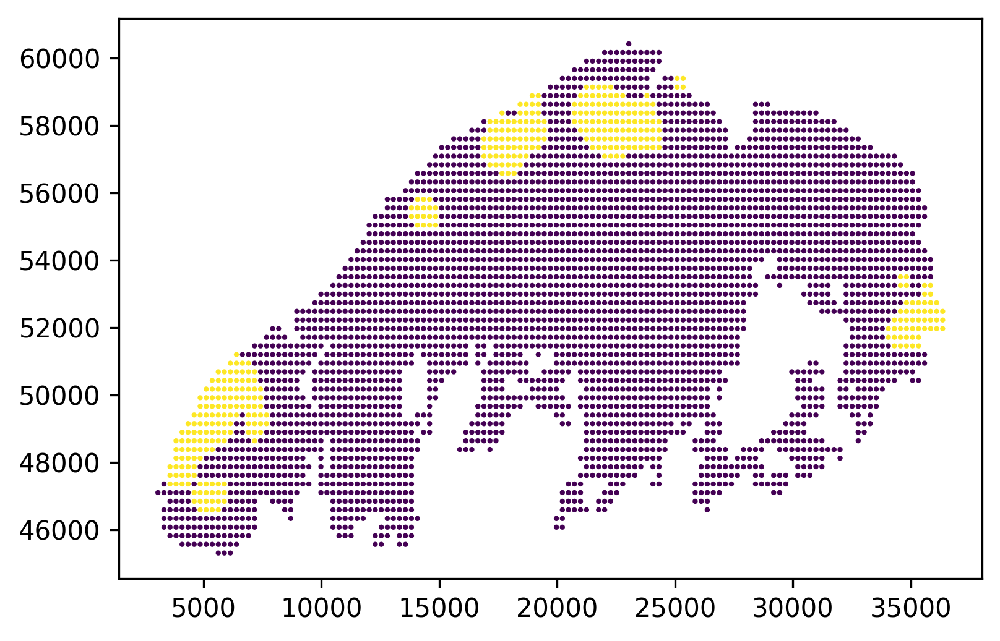

In [277]:
plt.scatter(*graph['xy'].T.tolist(),c=graph['y_pred'].argmax(axis=1),s=1)

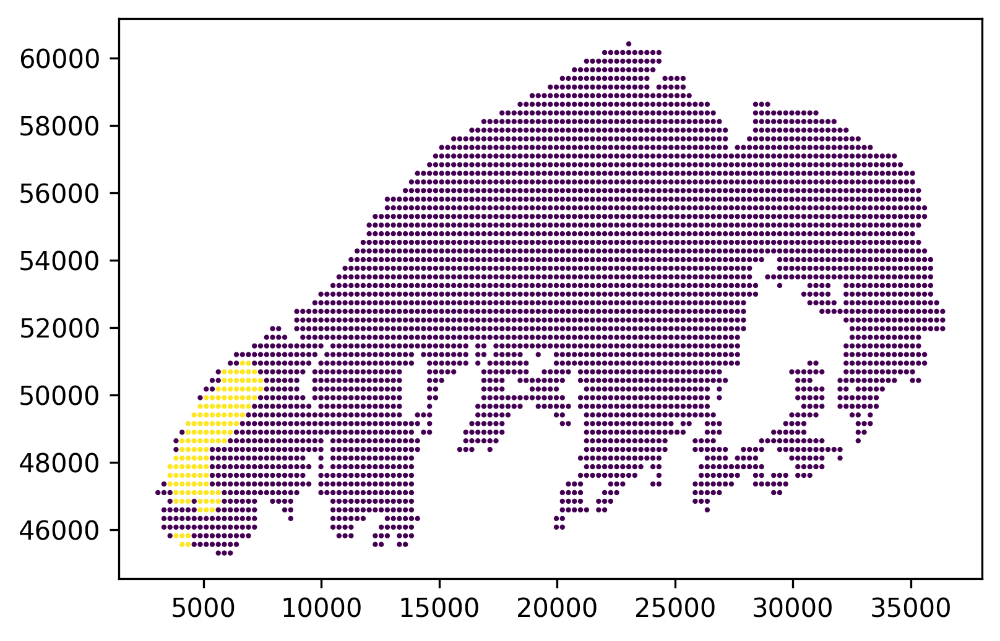

In [345]:
plt.scatter(*graph['xy'].T.tolist(),c=graph['y'],s=1)

'140_A1c'

100%|██████████| 295165/295165 [00:59<00:00, 4991.26it/s]


In [ ]:
# get all of them from the same slide, then do slicing, then produce mixed image and unmixed image

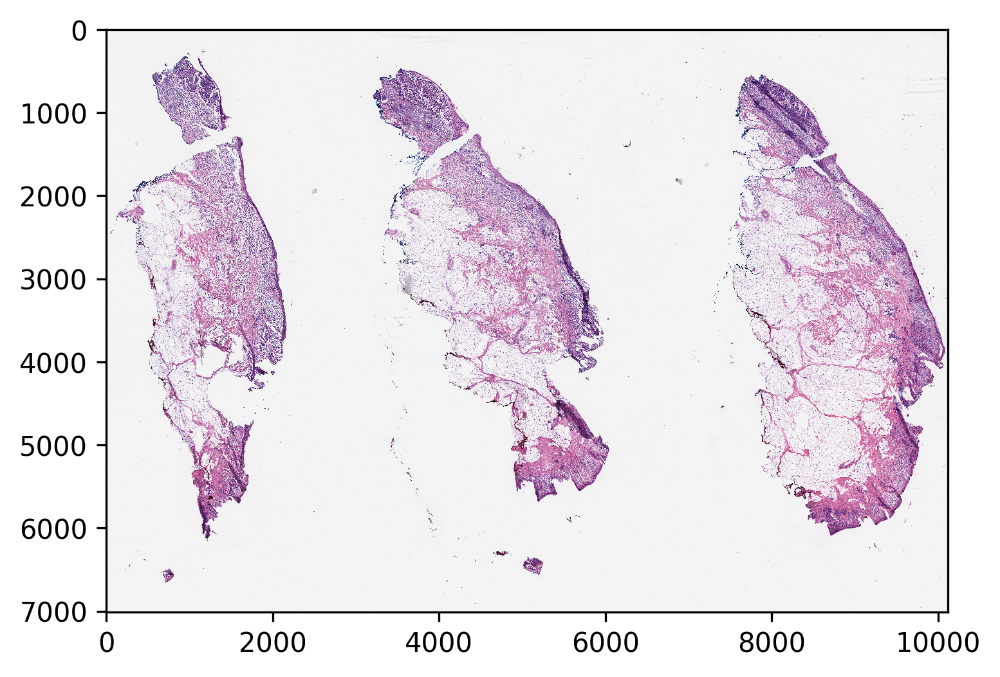

In [337]:
plt.imshow(arr)

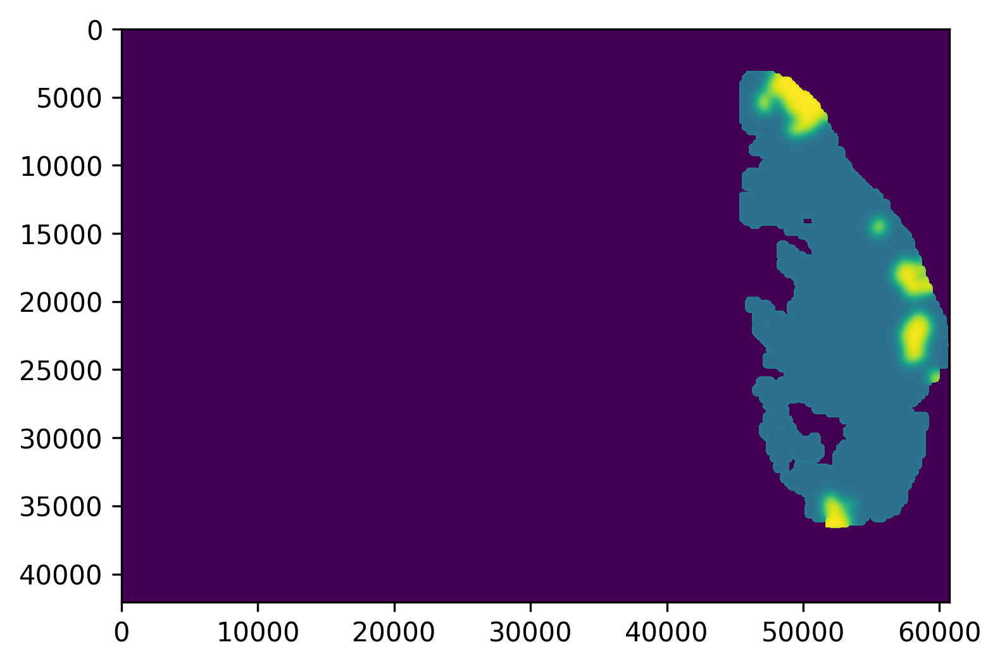

In [320]:
plt.imshow(pred_map)

In [336]:
arr.shape

(7009, 10119, 3)

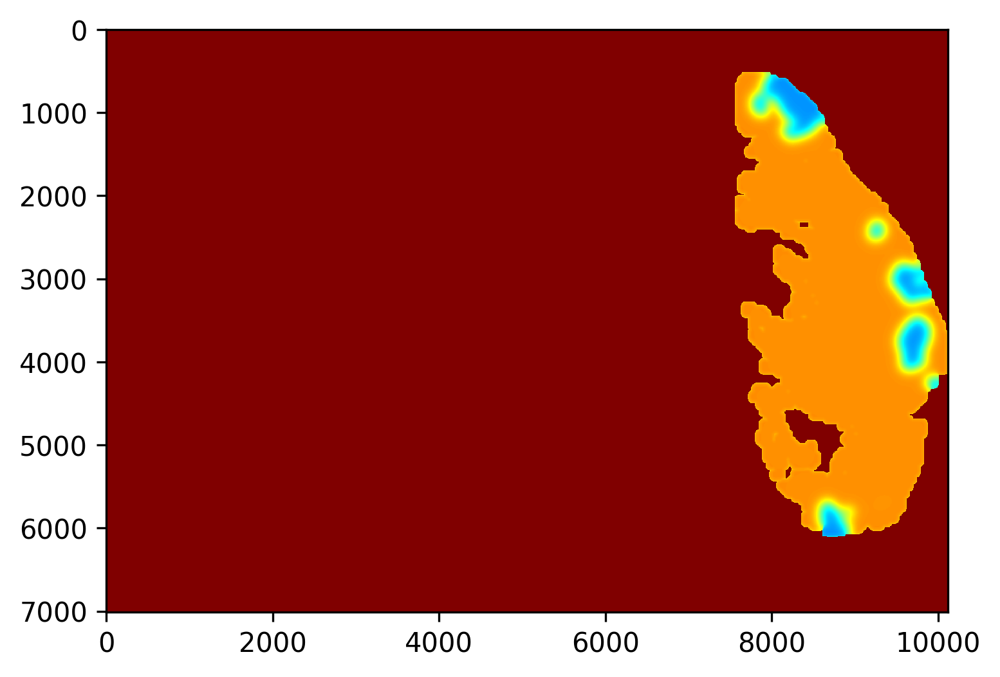

In [343]:
plt.imshow(new_pred_map)

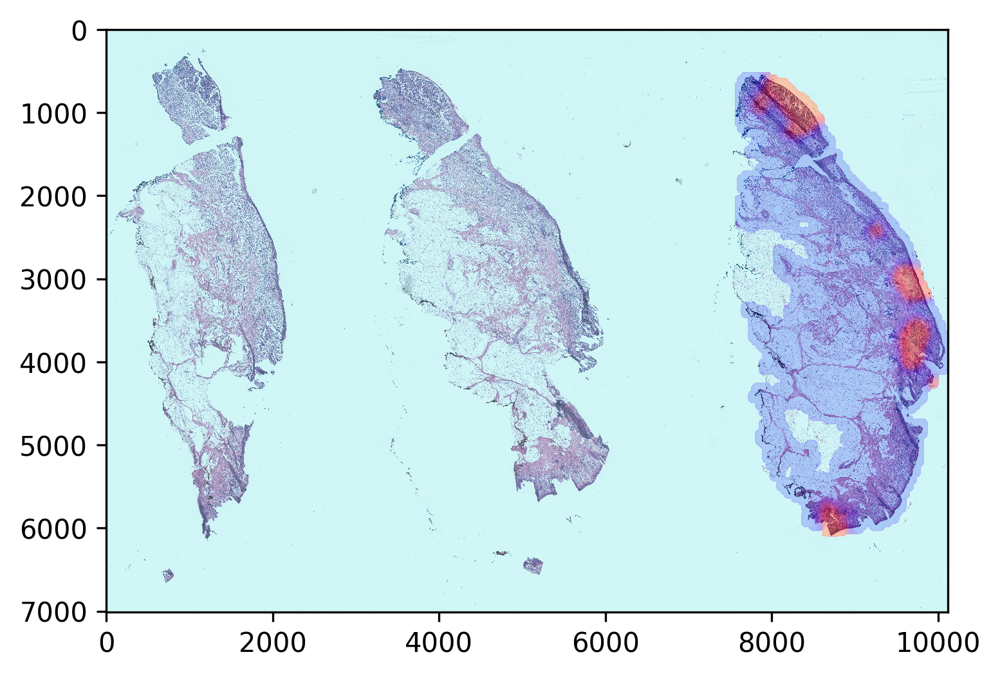

In [344]:
alpha=0.3
plt.imshow((arr*(1-alpha)+(255-new_pred_map)*alpha).astype(np.uint8))

In [332]:
new_pred_map.min()

0

In [308]:
arr.shape

(42056, 60713, 3)

In [299]:
# remove edges post

In [246]:
import torch.optim as opt

# optimizer=opt.Adam(net.parameters(),lr=1e-2)
# for i in range(5000):
#     y_true=F.softmax(graph_data.x[graph_data.mask])
#     y_pred=net(graph_data.x,graph_data.edge_index,graph_data.mask)[graph_data.mask]
#     loss=cross_entropy_with_probs(y_pred,y_true)
#     optimizer.zero_grad()
#     loss.backward()
#     optimizer.step()
#     print(loss.item())
#     del y_pred,loss
    

ValueError: optimizer got an empty parameter list

In [224]:
y_true

tensor([[0.6328, 0.3672],
        [0.6665, 0.3335],
        [0.6427, 0.3573],
        ...,
        [0.3160, 0.6840],
        [0.2988, 0.7012],
        [0.2862, 0.7138]])

In [210]:
y_pred[len(graph['xy']):]

array([[0.5000978 , 0.49990213],
       [0.50012106, 0.49987894],
       [0.50017583, 0.49982423],
       ...,
       [0.49960363, 0.5003964 ],
       [0.49973965, 0.50026035],
       [0.49981496, 0.5001851 ]], dtype=float32)

In [261]:
y_pred.detach().cpu().numpy()[:,1]

array([0.00356308, 0.002101  , 0.00297363, ..., 0.00096156, 0.00066006,
       0.00044096], dtype=float32)

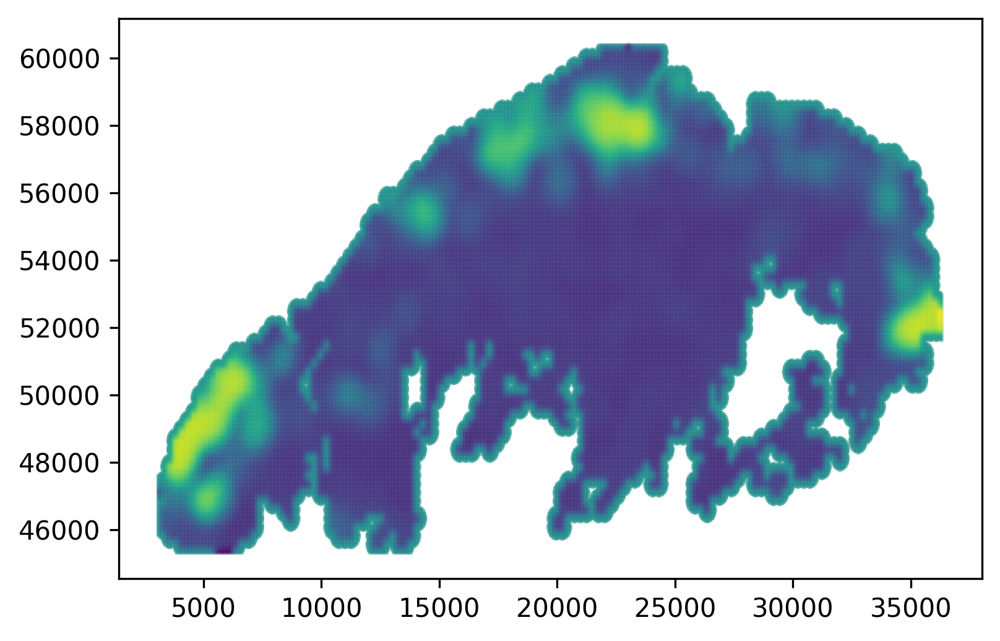

array([[0.50122124, 0.49877876],
       [0.50175923, 0.4982407 ],
       [0.5018213 , 0.49817866],
       ...,
       [0.4993707 , 0.50062925],
       [0.49945745, 0.5005426 ],
       [0.49955982, 0.5004402 ]], dtype=float32)

In [ ]:
# use a naive untrained GNN adding layers for label propagation?

In [53]:
#for i,j in G.nonzero()

In [21]:
graph_dataset['graph_dataset'][0]

Data(edge_index=[2, 33722], id="140_A1c", pos=[3988, 2], test_mask=[3988], train_mask=[3988], val_mask=[3988], x=[3988, 2048], y=[3988])